In [1]:
from op import ns_step

/hpc/group/yizhanglab/yz812/miniconda3/envs/pytorch/lib/python3.12/site-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


In [2]:
from STHD import train, sthdviz
path = '../STHD/analysis/colon_full_patchify/patches/45600_4990/'
data = train.load_data(path)

/hpc/group/yizhanglab/yz812/miniconda3/envs/pytorch/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/hpc/group/yizhanglab/yz812/miniconda3/envs/pytorch/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


[log] Number of spots:  28405


/hpc/group/yizhanglab/yz812/miniconda3/envs/pytorch/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
import pandas as pd

data.adata.obs['n_counts'] = data.adata.X.sum(axis=1)
df = data.adata.obs[['array_row', 'array_col', 'in_tissue', 'n_counts']]
epcam = data.adata.to_df()['EPCAM']
df = pd.concat([df, epcam], axis=1)

df_rasterize = sthdviz.rasterize_numerical(df, 'EPCAM')
df_in_tissue = sthdviz.rasterize_numerical(df, 'in_tissue')
df_n_counts = sthdviz.rasterize_numerical(df, 'n_counts')
# df_rasterize /= df_n_counts + 1 # normalize

426.0 599.0 174
163.0 336.0 174


100%|██████████| 28405/28405 [00:00<00:00, 1559250.41it/s]


426.0 599.0 174
163.0 336.0 174


100%|██████████| 28405/28405 [00:00<00:00, 1371607.57it/s]


426.0 599.0 174
163.0 336.0 174


100%|██████████| 28405/28405 [00:00<00:00, 1549073.01it/s]


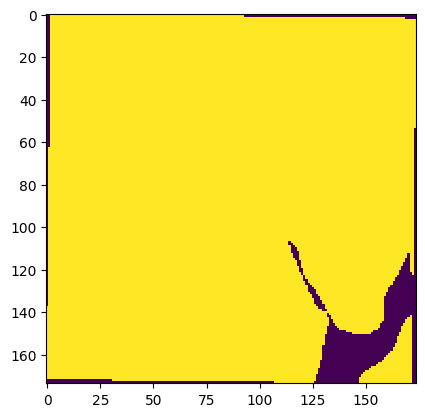

In [13]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.imshow(df_rasterize, interpolation='nearest')
plt.imshow(df_in_tissue, interpolation='nearest')

In [25]:
import torch
import torchvision.transforms as T
blur = T.GaussianBlur(kernel_size=15, sigma=5.0)

w, h = df_rasterize.shape
in_tissue = torch.from_numpy(df_in_tissue).cuda().unsqueeze(0).unsqueeze(0)
in_tissue_b = blur(in_tissue)
f = torch.from_numpy(df_rasterize).cuda().unsqueeze(0).unsqueeze(0)
v = (1-in_tissue_b).repeat(1,2,1,1) * 0.001
p = in_tissue * 0.001
v_min, v_max = df_rasterize.min(), df_rasterize.max()

def step(begin, t_range=(0, 100), stride=1, dt = 0.0005, dx = 1/200, Re = 10000.0):

    t0, tm = t_range

    f, v, p = begin

    df_dx, df_dy = ns_step.diff(f, dx)
    dv_dx, dv_dy = ns_step.diff(v, dx)
    
    result = [f]
    vel = [v]
    pres = [p]
    diff = [df_dx]

    for t in torch.arange(t0, tm, stride):
        for i in range(25):
            v, dv_dx, dv_dy = ns_step.update_velocity(v, dv_dx, dv_dy, p, dt, dx, Re)
            v = ns_step.vorticity_confinement(v, 1.0, dt, dx)
            p = ns_step.update_pressure(p, v, dt, dx)
            f, df_dx, df_dy = ns_step.update_density(f, df_dx, df_dy, v, dt, dx, Re)
            dfx, dfy = ns_step.diff(f, dx)

        result.append(f)
        vel.append(v)
        pres.append(p)
        diff.append(dfx)

    return result, vel, pres, diff

def step_non_advect(begin, t_range=(0, 100), stride=1, dt = 0.0005, dx = 1/200, Re = 10000.0):

    t0, tm = t_range

    f, v, p = begin
    v = torch.ones_like(v) * 0.00001

    df_dx, df_dy = ns_step.diff(f, dx)
    dv_dx, dv_dy = ns_step.diff(v, dx)
    
    result = [f]

    for t in torch.arange(t0, tm, stride):
        for i in range(25):
            f, df_dx, df_dy = ns_step.update_density(f, df_dx, df_dy, v, dt, dx, Re)

        result.append(f)

    return result

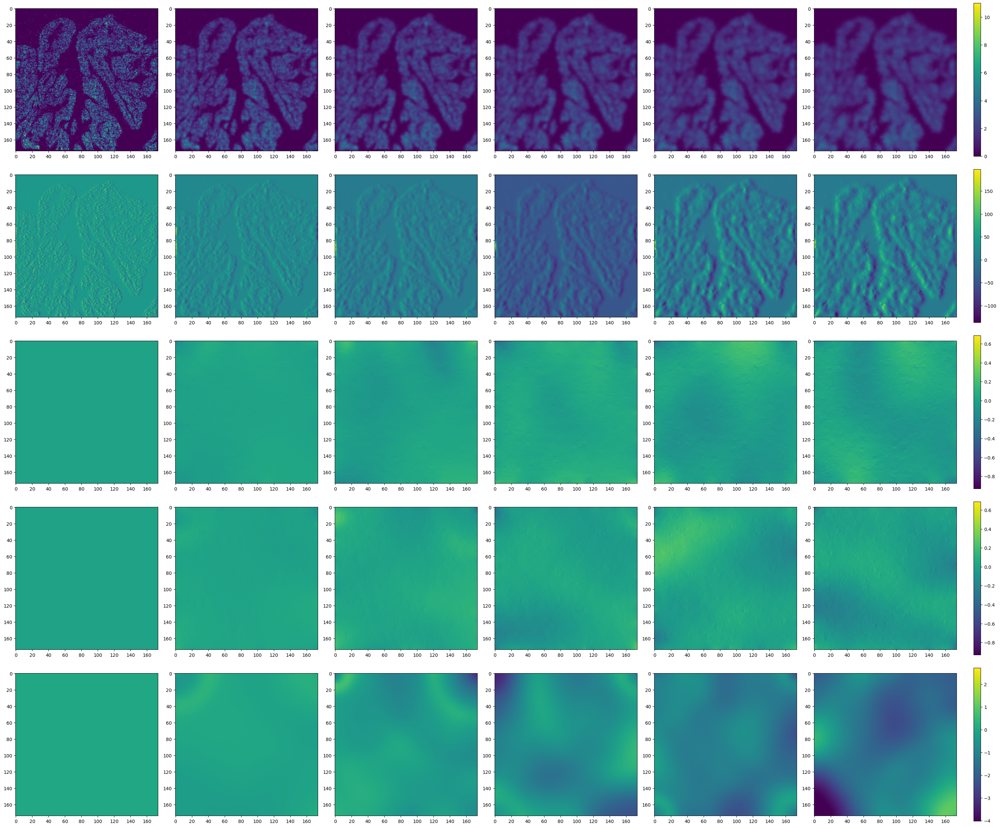

In [73]:
result, vel, pres, diff = step((f, v, p))
result, vel, pres, diff = result[::10], vel[::10], pres[::10], diff[::10]
rst_min, rst_max = result[0].min(), result[0].max()
vel_min, vel_max = vel[-1].min(), vel[-1].max()
prs_min, prs_max = pres[-1].min(), pres[-1].max()

fig, axe = plt.subplots(nrows=5, ncols=7, figsize=(30, 25), gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1, 0.05]})

for i in range(6):
    img1 = axe[0, i].imshow(result[i][0, 0].cpu(), vmin=rst_min, vmax=rst_max)
    img2 = axe[1, i].imshow(diff[i][0, 0].cpu())
    img3 = axe[2, i].imshow(vel[i][0, 0].cpu(), vmin=vel_min, vmax=vel_max)
    img4 = axe[3, i].imshow(vel[i][0, 1].cpu(), vmin=vel_min, vmax=vel_max)
    img5 = axe[4, i].imshow(pres[i][0, 0].cpu(), vmin=prs_min, vmax=prs_max)

# Add colorbars
cbar1 = fig.colorbar(img1, cax=axe[0, 6])
cbar2 = fig.colorbar(img2, cax=axe[1, 6])
cbar3 = fig.colorbar(img3, cax=axe[2, 6])
cbar4 = fig.colorbar(img4, cax=axe[3, 6])
cbar5 = fig.colorbar(img5, cax=axe[4, 6])

plt.tight_layout()
plt.savefig("plots/advect.png")

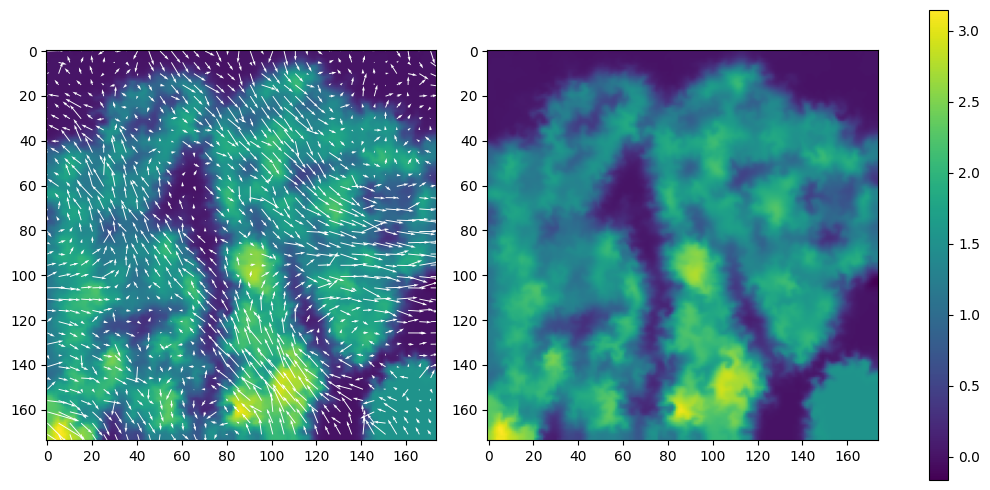

In [68]:
x, y = torch.meshgrid(torch.linspace(0, w, w)[::5], torch.linspace(0, h, h)[::5])

# Plot the vector field
fig, axe = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), gridspec_kw={'width_ratios': [1, 1, 0.05]})

img1 = axe[0].imshow(result[-1][0,0].cpu())
img1 = axe[0].quiver(x, y, vel[-1][0,0,::5,::5].cpu(), vel[-1][0,1,::5,::5].cpu(), color="white", scale=5)
img2 = axe[1].imshow(result[-1][0,0].cpu())
cbar = fig.colorbar(img2, cax=axe[2])

plt.tight_layout()
plt.savefig("plots/advect_vel.png")

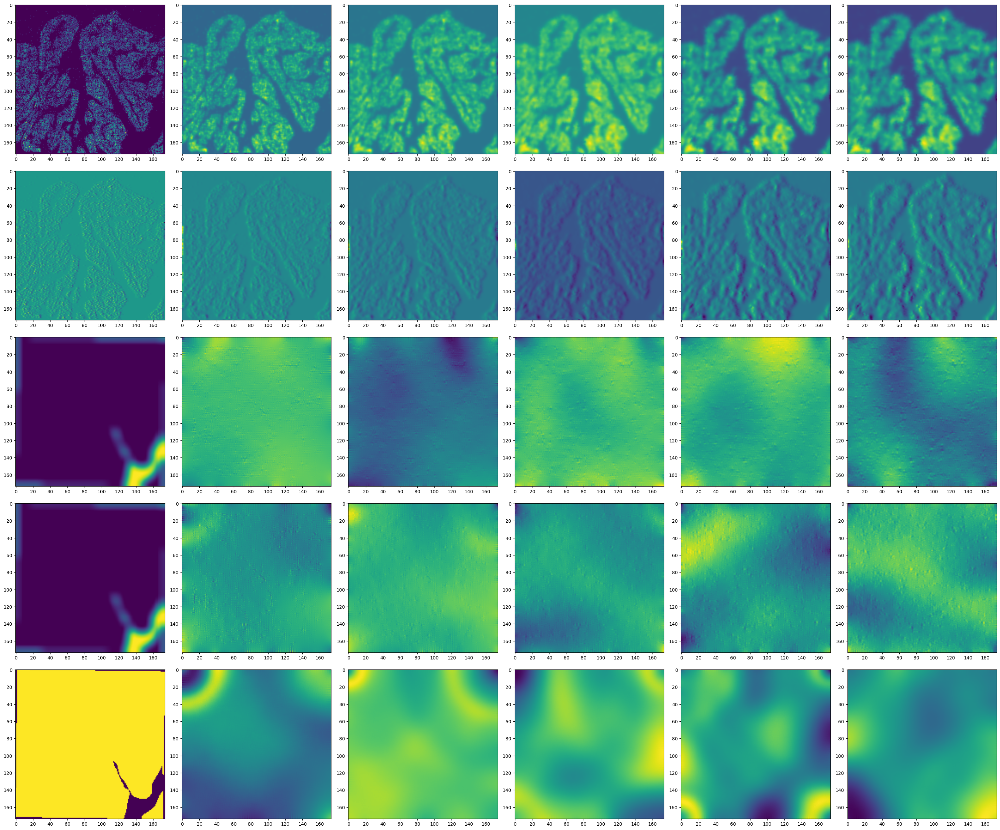

In [74]:
fig, axe = plt.subplots(nrows=5, ncols=6, figsize=(30, 25))

for i in range(6):
    img1 = axe[0, i].imshow(result[i][0, 0].cpu())
    img2 = axe[1, i].imshow(diff[i][0, 0].cpu())
    img3 = axe[2, i].imshow(vel[i][0, 0].cpu())
    img4 = axe[3, i].imshow(vel[i][0, 1].cpu())
    img5 = axe[4, i].imshow(pres[i][0, 0].cpu())

plt.tight_layout()
plt.savefig("plots/advect_raw.png")

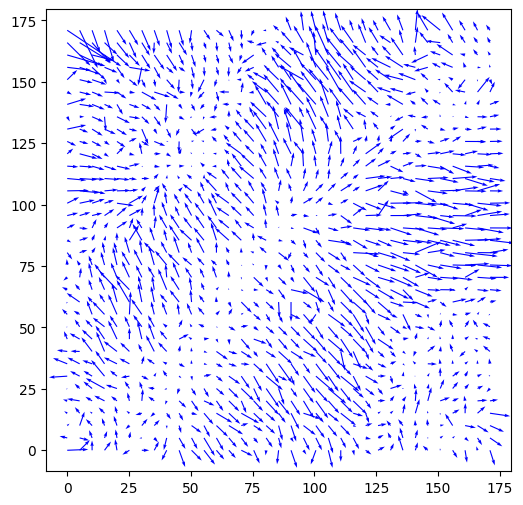

In [58]:
plt.figure(figsize=(6,6))
plt.quiver(x, y, vel[-1][0,0,::5,::5].cpu(), vel[-1][0,1,::5,::5].cpu(), color="blue", scale=5)

plt.savefig("plots/vel.png")

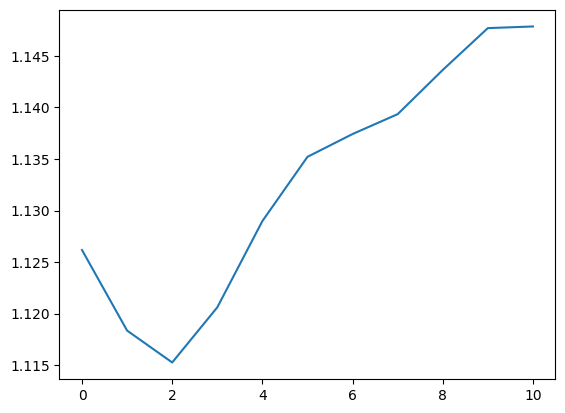

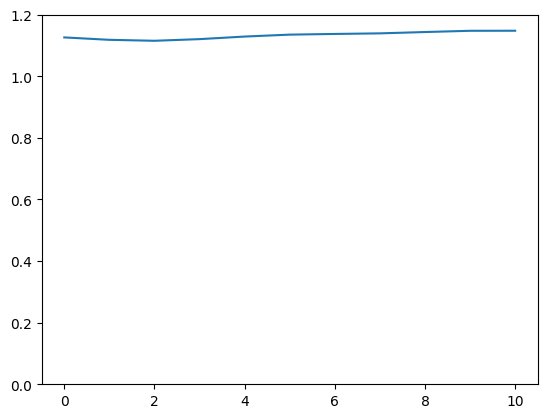

In [59]:
plt.plot([r.mean().cpu() for r in result])
plt.show()
plt.ylim(0.0, 1.2)
plt.plot([r.mean().cpu() for r in result])

plt.savefig("plots/count.png")

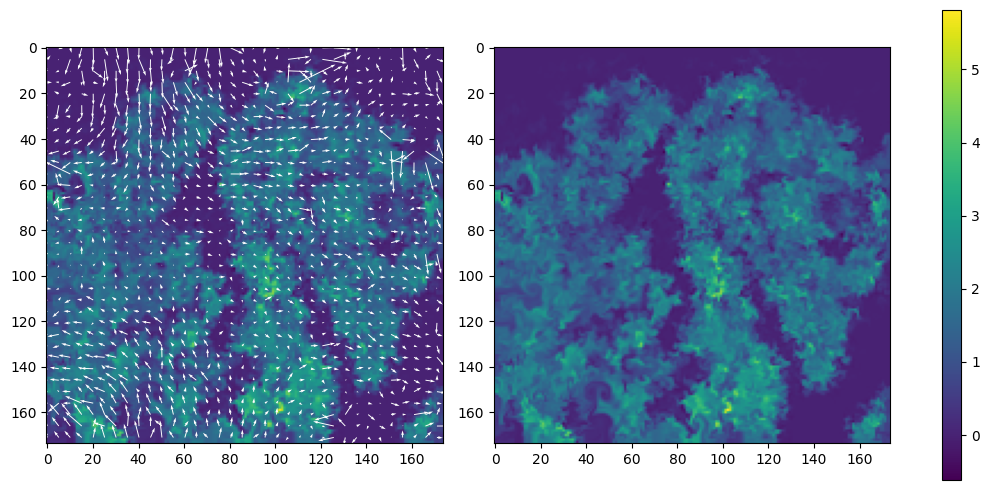

In [69]:
result, vel, pres, diff = step((f, v, p), Re=1000000.0)
fig, axe = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), gridspec_kw={'width_ratios': [1, 1, 0.05]})

img1 = axe[0].imshow(result[-1][0,0].cpu())
img1 = axe[0].quiver(x, y, vel[-1][0,0,::5,::5].cpu(), vel[-1][0,1,::5,::5].cpu(), color="white", scale=10)
img2 = axe[1].imshow(result[-1][0,0].cpu())
cbar = fig.colorbar(img2, cax=axe[2])

plt.tight_layout()

plt.savefig("plots/advect_1000000.png")

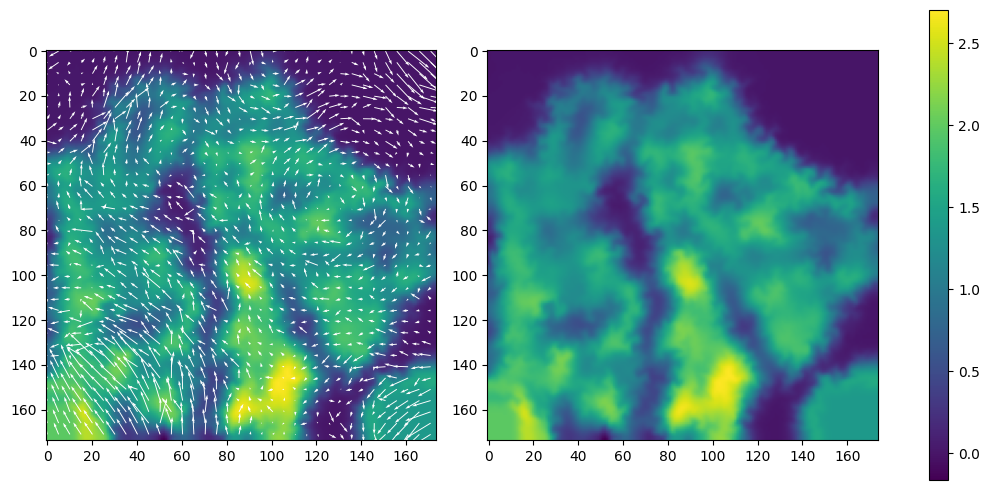

In [70]:
result, vel, pres, diff = step((f, v, p), Re=5000.0)
fig, axe = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), gridspec_kw={'width_ratios': [1, 1, 0.05]})

img1 = axe[0].imshow(result[-1][0,0].cpu())
img1 = axe[0].quiver(x, y, vel[-1][0,0,::5,::5].cpu(), vel[-1][0,1,::5,::5].cpu(), color="white", scale=5)
img2 = axe[1].imshow(result[-1][0,0].cpu())
cbar = fig.colorbar(img2, cax=axe[2])

plt.tight_layout()
plt.savefig("plots/advect_5000.png")

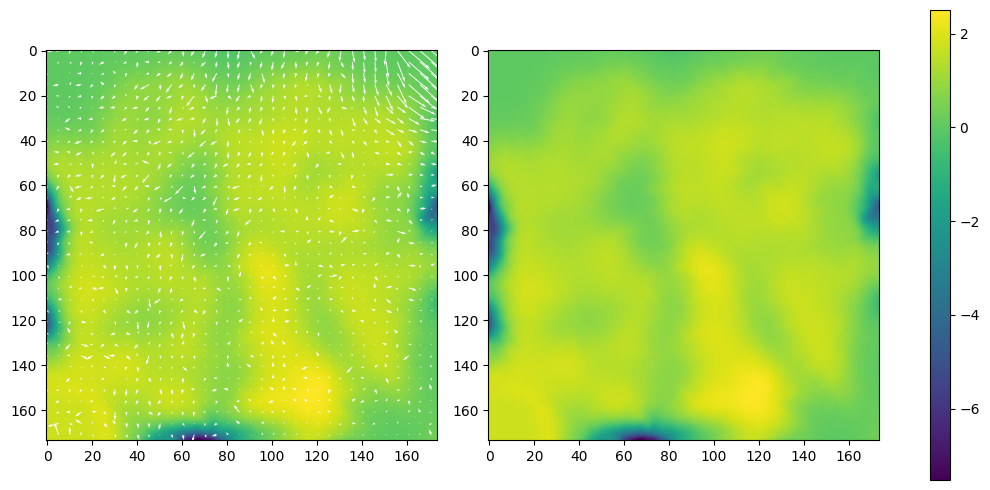

In [71]:
result, vel, pres, diff = step((f, v, p), Re=2000.0)
fig, axe = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), gridspec_kw={'width_ratios': [1, 1, 0.05]})

img1 = axe[0].imshow(result[-1][0,0].cpu())
img1 = axe[0].quiver(x, y, vel[-1][0,0,::5,::5].cpu(), vel[-1][0,1,::5,::5].cpu(), color="white", scale=5)
img2 = axe[1].imshow(result[-1][0,0].cpu())
cbar = fig.colorbar(img2, cax=axe[2])

plt.tight_layout()
plt.savefig("plots/advect_2000.png")

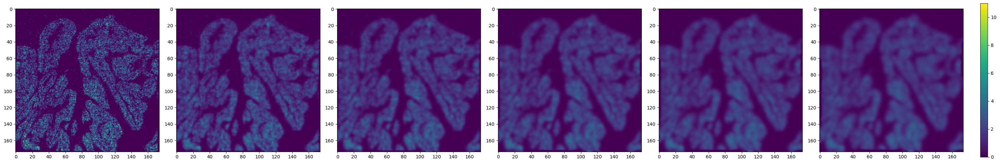

In [75]:
result = step_non_advect((f, v, p))[::10]
fig, axe = plt.subplots(nrows=1, ncols=7, figsize=(30, 5), gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1, 0.05]})
for i in range(6):
    img1 = axe[i].imshow(result[i][0, 0].cpu(), vmin=v_min, vmax=v_max)
    
cbar1 = fig.colorbar(img1, cax=axe[6])

plt.tight_layout()
plt.savefig("plots/non_advect.png")

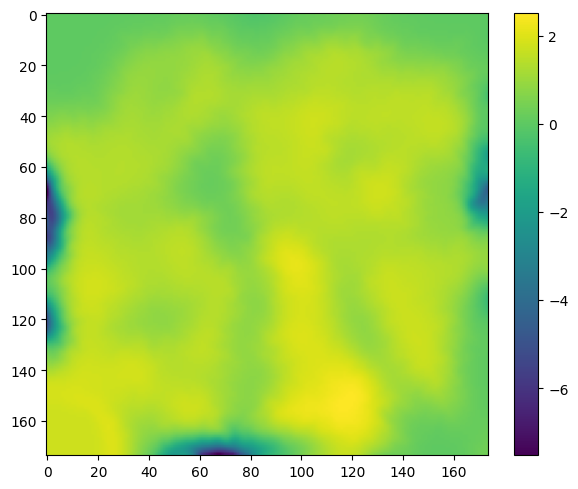

In [72]:
fig, axe = plt.subplots(nrows=1, ncols=2, figsize=(6, 5), gridspec_kw={'width_ratios': [1, 0.05]})

img1 = axe[0].imshow(result[-1][0,0].cpu())
cbar = fig.colorbar(img1, cax=axe[1])

plt.tight_layout()
plt.savefig("plots/non_advect_raw.png")

In [14]:
coords = data.get_sequencing_data_region()
print(coords)

(45589, 4980, 50605, 9995)


dict_keys(['images', 'metadata', 'scalefactors'])

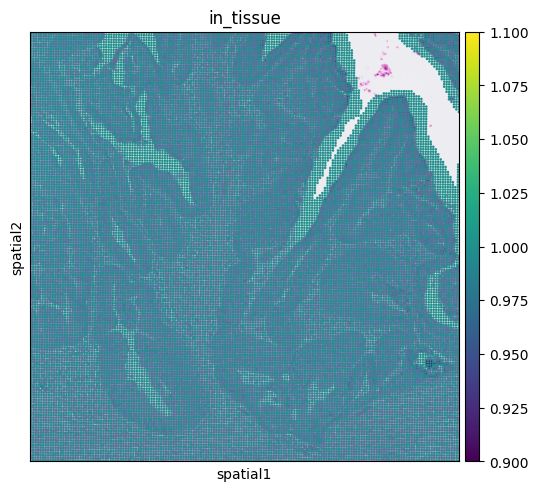

In [47]:
import squidpy as sq
sq.pl.spatial_scatter(
    data.adata,
    color=["in_tissue"],
    crop_coord=[coords], # should be coordinates in orignal fullres image
    #scalebar_dx=3.0,
    #scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
    #figsize=(20,20),
    #shape='square',
    #cmap='Reds'
)

In [48]:
from PIL import Image
import numpy as np

# Load TIFF image
image = Image.open("/hpc/group/yizhanglab/shared/HD/colon_cancer_P2/P2/square_002um/spatial/cytassist_image.tiff")

# Convert to NumPy array
image_array = np.array(image)

print(image_array.shape)  # Check the shape

(3000, 3200, 3)
